In [1]:
import os
import sys
import scipy
import numpy as np
import cv2
from PIL import Image
import moviepy.editor as mpy
from moviepy.video.io.bindings import mplfig_to_npimage
from scipy import stats
from matplotlib import pyplot as plt, rcParams, rc
from sklearn import decomposition

%matplotlib inline
%precision 4
%config InlineBackend.figure_format = 'retina'

rc('animation', html='html5')
rcParams['figure.figsize'] = 8, 10
np.set_printoptions(precision=4, linewidth=100)

In [2]:
# load the videos
video = mpy.VideoFileClip('C:/Users/Dell/Desktop/IIMB/data/video/Video_003.avi')


In [3]:
#video.subclip(0,50).ipython_display(width=300)
video.ipython_display(maxduration=200, width=300)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [4]:
video.duration, video.size, video.fps

(113.5700, [320, 240], 7.0000)

In [5]:
# def create_data_matrix_from_video(clip, k=5, scale=50):
#     return np.vstack([scipy.misc.imresize(rgb2gray(clip.get_frame(i/float(k))).astype(int), 
#                       scale).flatten() for i in range(k * int(clip.duration))]).T

# def create_data_matrix_from_video(clip, k=5, dims=(60,80)):
#     return np.vstack([np.array(Image.fromarray(rgb2grey(video.get_frame(i/float(k))).astype(int)).resize(size=dims)).flatten() for i in range(k * int(clip.duration))]).T


# def create_data_matrix_from_video(clip, k, dims):
#     frames = []
#     for i in range(k * int(clip.duration)):
#         frame = clip.get_frame(i / float(k))
#         frame=cv2.resize(frame, dims)
#         frame = rgb2grey(frame).astype(int)
#         frame=frame.flatten()
#         frames.append(frame)
#     return np.vstack(frames).T # stack images horizontally

# def rgb2grey(rgb):
#     return np.dot(rgb[..., :3], [0.299, 0.587, 0.114])


In [6]:
scale = 50   # Adjust scale to change resolution of image
dims = (int(240 * (scale/100)), int(320 * (scale/100)))

In [7]:
from skimage.transform import resize

def rgb_grey(rgb):
    return np.dot(rgb[..., :3], [0.299, 0.587, 0.114])

def create_data_matrix_from_video(clip, k=5, dims=(80,60)):
    return np.vstack([resize(rgb_grey(clip.get_frame(i/float(k))).astype(int), 
                      dims).flatten() for i in range(k * int(clip.duration))]).T


In [8]:
fps = 10
M = create_data_matrix_from_video(video, fps, dims)
M.shape, dims

((19200, 1130), (120, 160))

In [ ]:
#np.save("surveillance_matrix.npy", M)

In [ ]:
#M = np.load("surveillance_matrix.npy")

In [9]:
M

array([[6.6706e-08, 6.6706e-08, 6.6822e-08, ..., 6.7288e-08, 6.7288e-08, 6.7288e-08],
       [6.7404e-08, 6.7404e-08, 6.7521e-08, ..., 6.7987e-08, 6.7987e-08, 6.7987e-08],
       [6.7987e-08, 6.7987e-08, 6.7987e-08, ..., 6.8918e-08, 6.8918e-08, 6.8918e-08],
       ...,
       [3.5390e-08, 3.5390e-08, 3.5390e-08, ..., 3.6322e-08, 3.6322e-08, 3.6322e-08],
       [3.2131e-08, 3.2131e-08, 3.2131e-08, ..., 3.2713e-08, 3.2713e-08, 3.2713e-08],
       [2.2817e-08, 2.2817e-08, 2.2817e-08, ..., 2.3865e-08, 2.3865e-08, 2.3865e-08]])

In [10]:
M[:,1]

array([6.6706e-08, 6.7404e-08, 6.7987e-08, ..., 3.5390e-08, 3.2131e-08, 2.2817e-08])

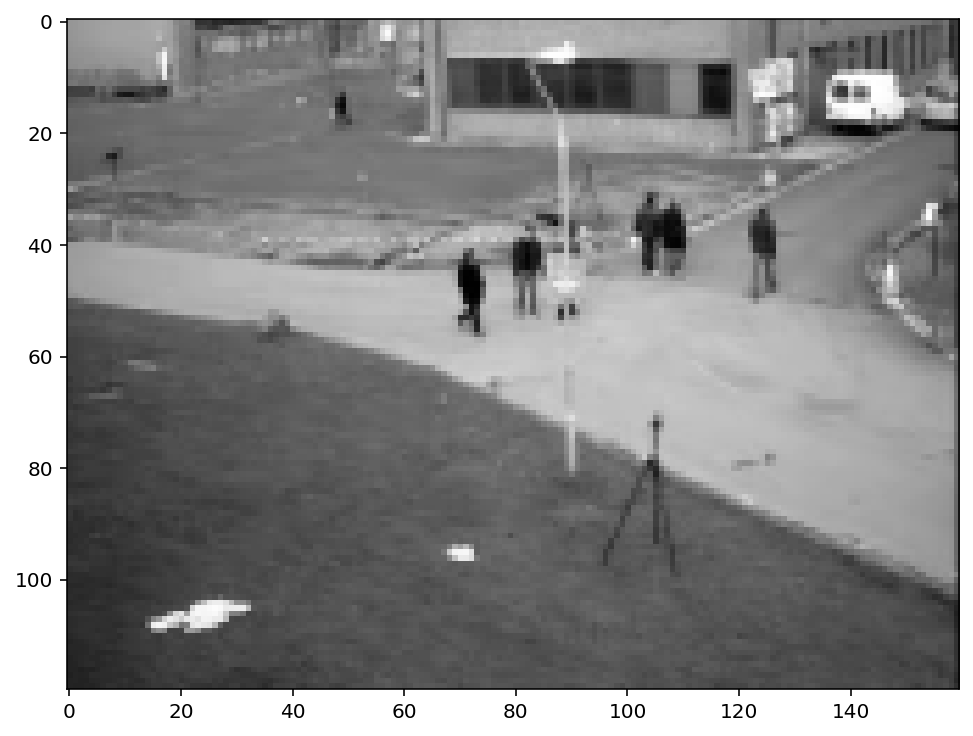

In [11]:
plt.imshow(np.reshape(M[:,140], dims), cmap='gray')

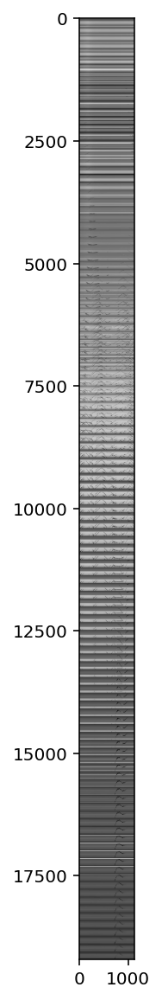

In [45]:
plt.figure(figsize=(10, 10))
plt.imshow(M, cmap='gray')

In [48]:
#plt.imsave(fname="M.jpg", arr=M, cmap='gray')

In [13]:
from scipy import sparse
from sklearn.utils.extmath import randomized_svd
import fbpca

In [14]:
TOL=1e-9

In [15]:
def converged(Z, d_norm):
    err = np.linalg.norm(Z, 'fro') / d_norm
    print('error: ', err)
    return err < TOL

In [16]:
def shrink(M, tau):
    S = np.abs(M) - tau
    return np.sign(M) * np.where(S>0, S, 0)

In [17]:
def _svd(M, rank):
    return fbpca.pca(M, k=min(rank, np.min(M.shape)), raw=True)

In [18]:
def norm_op(M):
    return _svd(M, 1)[1][0]

In [19]:
def svd_reconstruct(M, rank, min_sv):
    u, s, v = _svd(M, rank)
    s -= min_sv
    nnz = (s > 0).sum()
    return u[:,:nnz] @ np.diag(s[:nnz]) @ v[:nnz], nnz

In [20]:
m, n = M.shape
round(m * .05)

960

In [21]:
def pcp(X, maxiter=10, k=10): # refactored
    m, n = X.shape
    trans = m<n
    if trans: X = X.T; m, n = X.shape
        
    lamda = 1.0 / np.sqrt(np.max(M.shape))
    op_norm = norm_op(X)
    Y = np.copy(X) / max(op_norm, np.linalg.norm( X, np.inf) / lamda)
    mu = k*1.25/op_norm; mu_bar = mu * 1e7; rho = k * 1.5
    
    d_norm = np.linalg.norm(X, 'fro')
    L = np.zeros_like(X); sv = 1
    
    examples = []
    
    for i in range(maxiter):
        print("rank sv:", sv)
        X2 = X + Y/mu
        
        # update estimate of Sparse Matrix by "shrinking/truncating": original - low-rank
        S = shrink(X2 - L, lamda/mu)
        
        # update estimate of Low-rank Matrix by doing truncated SVD of rank sv & reconstructing.
        # count of singular values > 1/mu is returned as svp
        L, svp = svd_reconstruct(X2 - S, sv, 1/mu)
        
        # If svp < sv, you are already calculating enough singular values.
        # If not, add 20% (in this case 240) to sv
        sv = svp + (1 if svp < sv else round(0.05*n))
        
        # residual
        Z = X - L - S
        Y += mu*Z; mu *= rho
        
        examples.extend([S[140,:], L[140,:]])
        
        if m > mu_bar: m = mu_bar
        if converged(Z, d_norm): break
    
    if trans: L=L.T; S=S.T
    return L, S, examples

In [22]:
L, S, examples =  pcp(M, maxiter=5, k=10)

rank sv: 1
error:  0.14186281721141825
rank sv: 57
error:  0.0353943042565347
rank sv: 22
error:  0.0039545273840670475
rank sv: 78
error:  0.0003380823624752272
rank sv: 134
error:  1.217526724798903e-05


In [23]:
def plt_images(M, A, E, index_array, dims, filename=None):
    f = plt.figure(figsize=(15, 10))
    r = len(index_array)
    pics = r * 3
    for k, i in enumerate(index_array):
        for j, mat in enumerate([M, A, E]):
            sp = f.add_subplot(r, 3, 3*k + j + 1)
            sp.axis('Off')
            pixels = mat[:,i]
            if isinstance(pixels, scipy.sparse.csr_matrix):
                pixels = pixels.todense()
            plt.imshow(np.reshape(pixels, dims), cmap='gray')
    return f

def plots(ims, dims, figsize=(15,20), rows=1, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims)
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        sp = f.add_subplot(rows, len(ims)//rows, i+1)
        sp.axis('Off')
        plt.imshow(np.reshape(ims[i], dims), cmap="gray")

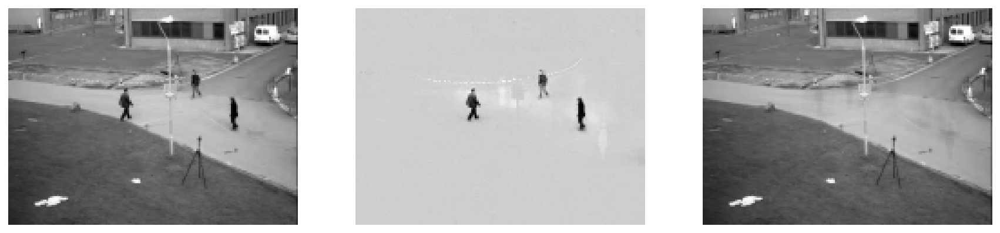

In [24]:
f = plt_images(M, S, L, [10], dims)

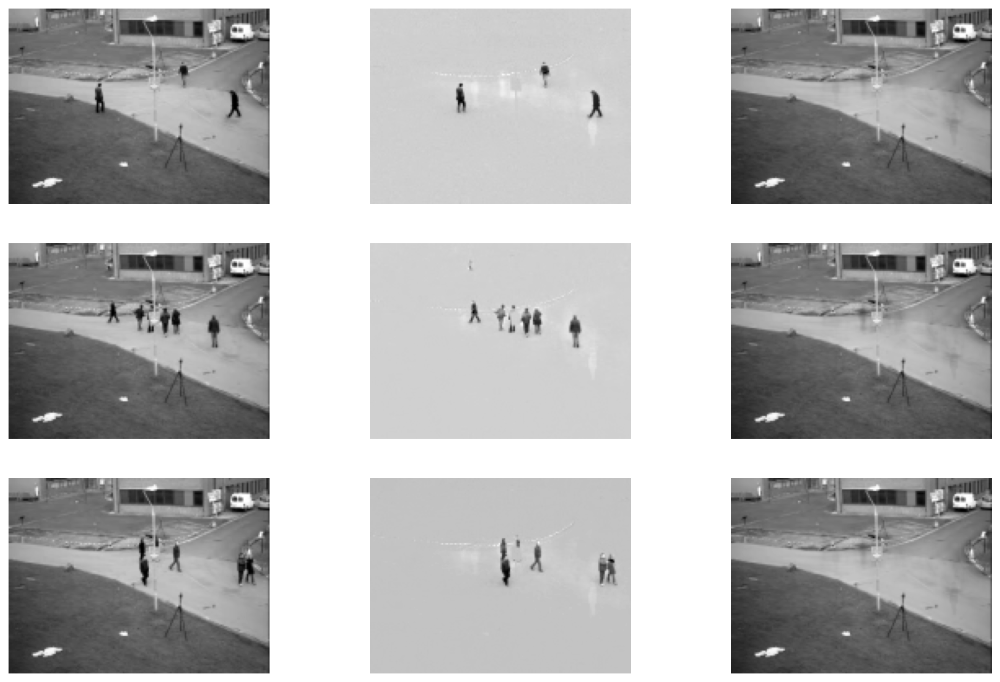

In [25]:
f = plt_images(M, S, L, [0, 100, 500], dims)

Moviepy - Building video people1.mp4.
Moviepy - Writing video people1.mp4



Moviepy - Done !
Moviepy - video ready people1.mp4


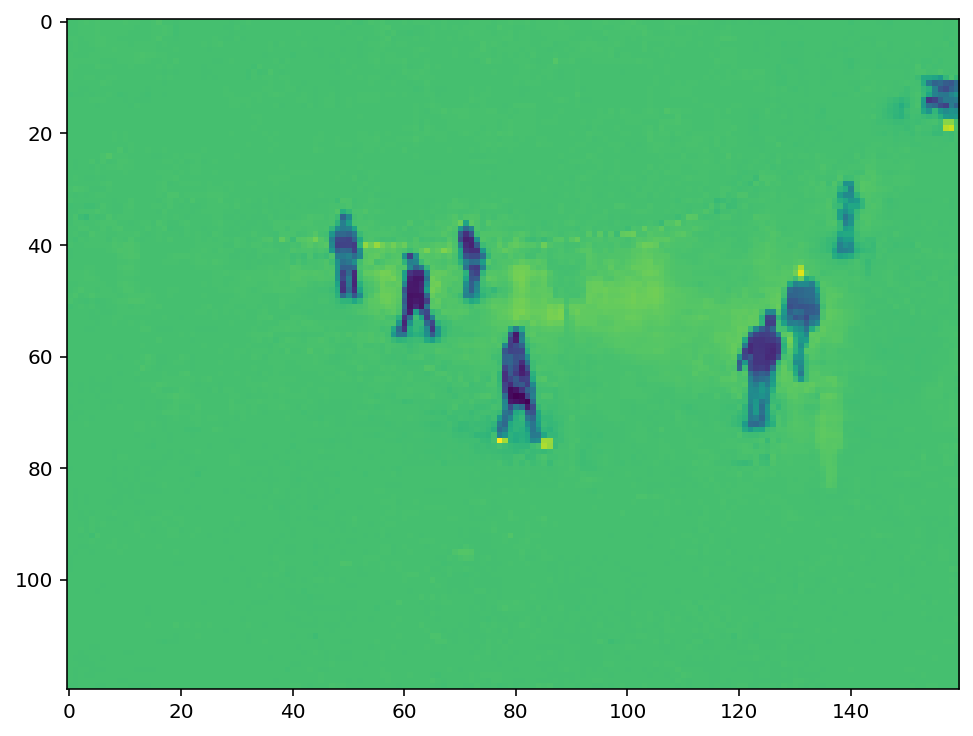

In [27]:
people_frames = S.reshape((dims[0], dims[1], -1))

fig, ax = plt.subplots()
def make_frame(t):
    ax.clear()
    ax.imshow(people_frames[...,int(t*fps)])
    return mplfig_to_npimage(fig)

animation = mpy.VideoClip(make_frame, duration=int(video.duration-1))
animation.write_videofile('people1.mp4', fps=fps)

In [28]:
AA1 = mpy.VideoFileClip('people1.mp4')
AA1.ipython_display(maxduration=200, width=300)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


Moviepy - Building video background_pcp.mp4.
Moviepy - Writing video background_pcp.mp4



Moviepy - Done !
Moviepy - video ready background_pcp.mp4


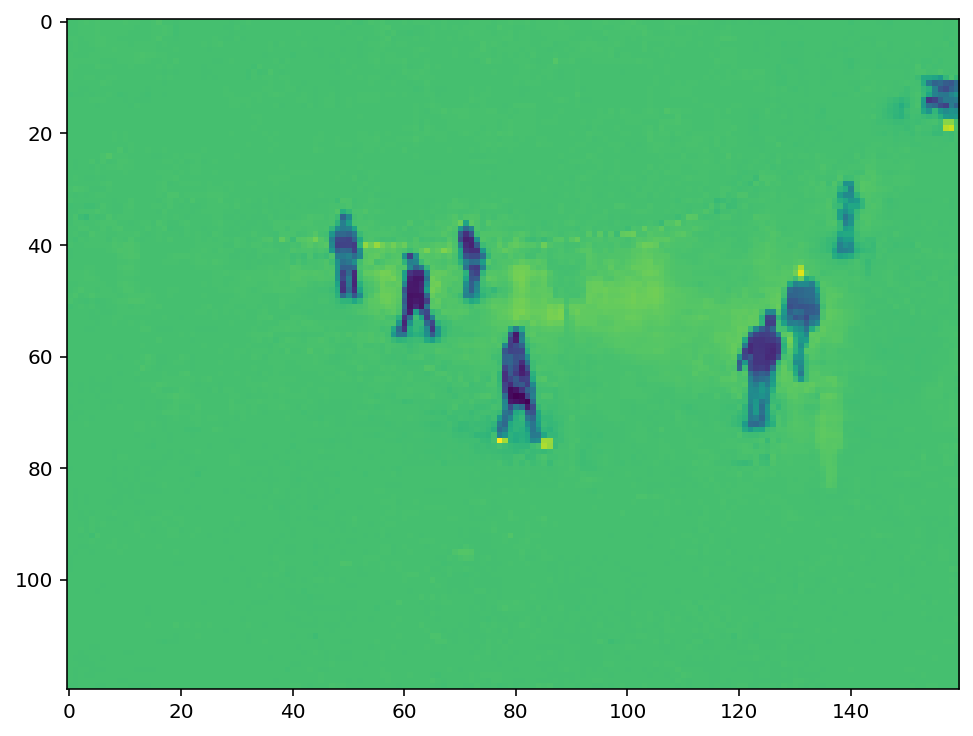

In [29]:
background_frames = L.reshape((dims[0], dims[1], -1))

fig, ax = plt.subplots()
def make_frame(t):
    ax.clear()
    ax.imshow(people_frames[...,int(t*fps)])
    return mplfig_to_npimage(fig)

animation = mpy.VideoClip(make_frame, duration=int(video.duration-1))
animation.write_videofile('background_pcp.mp4', fps=fps)

In [30]:
AA2 = mpy.VideoFileClip('background_pcp.mp4')
AA2.ipython_display(maxduration=200, width=300)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
original_frames = M.reshape((dims[0], dims[1], -1))

fig, ax = plt.subplots()
def make_frame(t):
    ax.clear()
    ax.imshow(people_frames[...,int(t*fps)])
    return mplfig_to_npimage(fig)

animation = mpy.VideoClip(make_frame, duration=int(video.duration-1))
animation.write_videofile('original_pcp.mp4', fps=fps)

In [ ]:
AA3 = mpy.VideoFileClip('original_pcp.mp4')
AA3.ipython_display(maxduration=200, width=300)

In [31]:
display(M)
display(L)
display(S)

array([[6.6706e-08, 6.6706e-08, 6.6822e-08, ..., 6.7288e-08, 6.7288e-08, 6.7288e-08],
       [6.7404e-08, 6.7404e-08, 6.7521e-08, ..., 6.7987e-08, 6.7987e-08, 6.7987e-08],
       [6.7987e-08, 6.7987e-08, 6.7987e-08, ..., 6.8918e-08, 6.8918e-08, 6.8918e-08],
       ...,
       [3.5390e-08, 3.5390e-08, 3.5390e-08, ..., 3.6322e-08, 3.6322e-08, 3.6322e-08],
       [3.2131e-08, 3.2131e-08, 3.2131e-08, ..., 3.2713e-08, 3.2713e-08, 3.2713e-08],
       [2.2817e-08, 2.2817e-08, 2.2817e-08, ..., 2.3865e-08, 2.3865e-08, 2.3865e-08]])

array([[6.6965e-08, 6.6965e-08, 6.7093e-08, ..., 6.7169e-08, 6.7282e-08, 6.7255e-08],
       [6.7360e-08, 6.7360e-08, 6.7495e-08, ..., 6.7672e-08, 6.7766e-08, 6.7737e-08],
       [6.7823e-08, 6.7823e-08, 6.7941e-08, ..., 6.8199e-08, 6.8300e-08, 6.8295e-08],
       ...,
       [3.6651e-08, 3.6651e-08, 3.6683e-08, ..., 3.6206e-08, 3.6246e-08, 3.6208e-08],
       [3.2113e-08, 3.2113e-08, 3.2129e-08, ..., 3.2642e-08, 3.2659e-08, 3.2627e-08],
       [2.3417e-08, 2.3417e-08, 2.3428e-08, ..., 2.3842e-08, 2.3862e-08, 2.3847e-08]])

array([[-2.5931e-10, -2.5931e-10, -2.7069e-10, ...,  1.1903e-10,  4.9468e-12,  3.3723e-11],
       [ 4.3995e-11,  4.3995e-11,  2.4739e-11, ...,  3.1408e-10,  2.2053e-10,  2.4890e-10],
       [ 1.6357e-10,  1.6357e-10,  4.5731e-11, ...,  7.1806e-10,  6.1809e-10,  6.2268e-10],
       ...,
       [-1.2603e-09, -1.2603e-09, -1.2929e-09, ...,  1.1522e-10,  7.5259e-11,  1.1408e-10],
       [ 1.5892e-11,  1.5892e-11,  0.0000e+00, ...,  7.0256e-11,  5.3762e-11,  8.5398e-11],
       [-5.9920e-10, -5.9920e-10, -6.1041e-10, ...,  2.4035e-11,  2.0040e-12,  1.8448e-11]])

In [32]:
from __future__ import division, print_function

__all__ = ["pcp"]

import time
import fbpca
import logging
import numpy as np
from scipy.sparse.linalg import svds


def pcp(M, delta=1e-7, mu=None, maxiter=500, verbose=False, missing_data=True,
        svd_method="approximate", **svd_args):
    # Check the SVD method.
    allowed_methods = ["approximate", "exact", "sparse"]
    if svd_method not in allowed_methods:
        raise ValueError("'svd_method' must be one of: {0}"
                         .format(allowed_methods))

    # Check for missing data.
    shape = M.shape
    if missing_data:
        missing = ~(np.isfinite(M))
        if np.any(missing):
            M = np.array(M)
            M[missing] = 0.0
    else:
        missing = np.zeros_like(M, dtype=bool)
        if not np.all(np.isfinite(M)):
            logging.warn("The matrix has non-finite entries. "
                         "SVD will probably fail.")

    # Initialize the tuning parameters.
    lam = 1.0 / np.sqrt(np.max(shape))
    if mu is None:
        mu = 0.25 * np.prod(shape) / np.sum(np.abs(M))
        if verbose:
            print("mu = {0}".format(mu))

    # Convergence criterion.
    norm = np.sum(M ** 2)

    # Iterate.
    i = 0
    rank = np.min(shape)
    S = np.zeros(shape)
    Y = np.zeros(shape)
    d_norm = np.linalg.norm(M, 'fro')
    while i < max(maxiter, 1):
        # SVD step.
        strt = time.time()
        u, s, v = _svd(svd_method, M - S + Y / mu, rank+1, 1./mu, **svd_args)
        svd_time = time.time() - strt

        s = shrink(s, 1./mu)
        rank = np.sum(s > 0.0)
        u, s, v = u[:, :rank], s[:rank], v[:rank, :]
        L = np.dot(u, np.dot(np.diag(s), v))

        # Shrinkage step.
        S = shrink(M - L + Y / mu, lam / mu)

        # Lagrange step.
        step = M - L - S
        step[missing] = 0.0
        Y += mu * step

        # Check for convergence.
        err = np.linalg.norm(step, 'fro') / d_norm
        if verbose:
            print(("Iteration {0}: error={1:.5e}, rank={2:d}, nnz={3:d}, "
                   "time={4:.3e}")
                  .format(i, err, np.sum(s > 0), np.sum(S > 0), svd_time))
        if converged(err, delta):
            break
        i += 1

    if i >= maxiter:
        logging.warn("convergence not reached in pcp")
    return L, S, (u, s, v)


def shrink(M, tau):
    sgn = np.sign(M)
    S = np.abs(M) - tau
    S[S < 0.0] = 0.0
    return sgn * S

def converged(err, delta):
    return err < delta

def _svd(method, X, rank, tol, **args):
    rank = min(rank, np.min(X.shape))
    if method == "approximate":
        return fbpca.pca(X, k=rank, raw=True, **args)
    elif method == "exact":
        return np.linalg.svd(X, full_matrices=False, **args)
    elif method == "sparse":
        if rank >= np.min(X.shape):
            return np.linalg.svd(X, full_matrices=False)
        u, s, v = svds(X, k=rank, tol=tol)
        u, s, v = u[:, ::-1], s[::-1], v[::-1, :]
        return u, s, v
    raise ValueError("invalid SVD method")

In [33]:
L, S, (u, s, v) = pcp(M, maxiter=1000, verbose=True, svd_method="exact")

mu = 4571078.551929649
Iteration 0: error=8.32300e-03, rank=618, nnz=500702, time=1.219e+01
Iteration 1: error=2.76604e-03, rank=470, nnz=749779, time=1.362e+01
Iteration 2: error=2.70721e-03, rank=355, nnz=957260, time=9.466e+00
Iteration 3: error=2.52300e-03, rank=305, nnz=1150677, time=1.105e+01
Iteration 4: error=2.34970e-03, rank=272, nnz=1340524, time=9.833e+00
Iteration 5: error=2.21062e-03, rank=247, nnz=1528634, time=9.650e+00
Iteration 6: error=2.07659e-03, rank=233, nnz=1708696, time=1.256e+01
Iteration 7: error=1.94809e-03, rank=225, nnz=1879616, time=1.097e+01
Iteration 8: error=1.83490e-03, rank=221, nnz=2036707, time=9.820e+00
Iteration 9: error=1.73368e-03, rank=221, nnz=2181287, time=1.145e+01
Iteration 10: error=1.63882e-03, rank=223, nnz=2307354, time=8.835e+00
Iteration 11: error=1.54869e-03, rank=225, nnz=2421238, time=8.683e+00
Iteration 12: error=1.46905e-03, rank=229, nnz=2523321, time=9.620e+00
Iteration 13: error=1.39312e-03, rank=232, nnz=2612594, time=9.400e

Iteration 116: error=4.20822e-05, rank=385, nnz=4523526, time=9.769e+00
Iteration 117: error=4.16095e-05, rank=386, nnz=4528085, time=9.501e+00
Iteration 118: error=4.11227e-05, rank=387, nnz=4532765, time=9.197e+00
Iteration 119: error=4.05938e-05, rank=388, nnz=4537178, time=9.150e+00
Iteration 120: error=4.01119e-05, rank=388, nnz=4541505, time=9.077e+00
Iteration 121: error=3.96640e-05, rank=389, nnz=4545770, time=9.850e+00
Iteration 122: error=3.92428e-05, rank=389, nnz=4550282, time=9.946e+00
Iteration 123: error=3.87951e-05, rank=390, nnz=4554620, time=9.583e+00
Iteration 124: error=3.83574e-05, rank=390, nnz=4558885, time=8.903e+00
Iteration 125: error=3.78886e-05, rank=391, nnz=4563163, time=8.766e+00
Iteration 126: error=3.74580e-05, rank=392, nnz=4567594, time=9.732e+00
Iteration 127: error=3.70429e-05, rank=392, nnz=4571766, time=1.053e+01
Iteration 128: error=3.66605e-05, rank=392, nnz=4575858, time=9.583e+00
Iteration 129: error=3.63107e-05, rank=392, nnz=4580050, time=9.

Iteration 230: error=1.75627e-05, rank=429, nnz=4867722, time=9.083e+00
Iteration 231: error=1.74732e-05, rank=429, nnz=4869627, time=9.783e+00
Iteration 232: error=1.73902e-05, rank=429, nnz=4871599, time=9.398e+00
Iteration 233: error=1.72989e-05, rank=431, nnz=4873733, time=9.416e+00
Iteration 234: error=1.71918e-05, rank=431, nnz=4875689, time=9.133e+00
Iteration 235: error=1.71025e-05, rank=431, nnz=4877627, time=9.800e+00
Iteration 236: error=1.70234e-05, rank=431, nnz=4879613, time=9.169e+00
Iteration 237: error=1.69461e-05, rank=431, nnz=4881609, time=9.650e+00
Iteration 238: error=1.68685e-05, rank=431, nnz=4883637, time=1.104e+01
Iteration 239: error=1.67867e-05, rank=432, nnz=4885579, time=9.663e+00
Iteration 240: error=1.66978e-05, rank=432, nnz=4887492, time=9.117e+00
Iteration 241: error=1.66193e-05, rank=432, nnz=4889421, time=8.651e+00
Iteration 242: error=1.65451e-05, rank=432, nnz=4891418, time=8.933e+00
Iteration 243: error=1.64708e-05, rank=432, nnz=4893402, time=9.

Iteration 344: error=1.10171e-05, rank=454, nnz=5052409, time=1.010e+01
Iteration 345: error=1.09827e-05, rank=454, nnz=5053708, time=1.017e+01
Iteration 346: error=1.09489e-05, rank=454, nnz=5055032, time=1.004e+01
Iteration 347: error=1.09050e-05, rank=455, nnz=5056409, time=9.850e+00
Iteration 348: error=1.08656e-05, rank=455, nnz=5057679, time=9.663e+00
Iteration 349: error=1.08313e-05, rank=455, nnz=5058837, time=9.683e+00
Iteration 350: error=1.07986e-05, rank=455, nnz=5060141, time=9.816e+00
Iteration 351: error=1.07658e-05, rank=455, nnz=5061502, time=1.013e+01
Iteration 352: error=1.07331e-05, rank=455, nnz=5062815, time=1.014e+01
Iteration 353: error=1.07006e-05, rank=455, nnz=5064117, time=1.135e+01
Iteration 354: error=1.06686e-05, rank=455, nnz=5065369, time=1.013e+01
Iteration 355: error=1.06366e-05, rank=455, nnz=5066640, time=9.633e+00
Iteration 356: error=1.06049e-05, rank=455, nnz=5067973, time=9.518e+00
Iteration 357: error=1.05736e-05, rank=455, nnz=5069200, time=9.

Iteration 458: error=7.93529e-06, rank=470, nnz=5178720, time=9.698e+00
Iteration 459: error=7.91300e-06, rank=470, nnz=5179597, time=1.118e+01
Iteration 460: error=7.89407e-06, rank=470, nnz=5180554, time=9.794e+00
Iteration 461: error=7.87581e-06, rank=470, nnz=5181454, time=9.253e+00
Iteration 462: error=7.85746e-06, rank=470, nnz=5182415, time=9.390e+00
Iteration 463: error=7.83910e-06, rank=470, nnz=5183317, time=9.529e+00
Iteration 464: error=7.82069e-06, rank=470, nnz=5184304, time=9.972e+00
Iteration 465: error=7.79702e-06, rank=471, nnz=5185273, time=9.345e+00
Iteration 466: error=7.77424e-06, rank=471, nnz=5186199, time=8.917e+00
Iteration 467: error=7.75511e-06, rank=471, nnz=5187105, time=9.018e+00
Iteration 468: error=7.73761e-06, rank=471, nnz=5187964, time=9.933e+00
Iteration 469: error=7.72002e-06, rank=471, nnz=5188953, time=9.417e+00
Iteration 470: error=7.70197e-06, rank=471, nnz=5189920, time=9.833e+00
Iteration 471: error=7.68409e-06, rank=471, nnz=5190835, time=9.

Iteration 572: error=6.12471e-06, rank=483, nnz=5273111, time=1.176e+01
Iteration 573: error=6.11057e-06, rank=483, nnz=5273800, time=9.350e+00
Iteration 574: error=6.09872e-06, rank=483, nnz=5274462, time=9.966e+00
Iteration 575: error=6.08722e-06, rank=483, nnz=5275177, time=1.113e+01
Iteration 576: error=6.07571e-06, rank=483, nnz=5275916, time=9.538e+00
Iteration 577: error=6.06399e-06, rank=483, nnz=5276604, time=9.683e+00
Iteration 578: error=6.05245e-06, rank=483, nnz=5277331, time=9.407e+00
Iteration 579: error=6.04100e-06, rank=483, nnz=5278068, time=9.040e+00
Iteration 580: error=6.02961e-06, rank=483, nnz=5278771, time=8.996e+00
Iteration 581: error=6.01846e-06, rank=483, nnz=5279466, time=9.904e+00
Iteration 582: error=6.00732e-06, rank=483, nnz=5280201, time=9.683e+00
Iteration 583: error=5.99619e-06, rank=483, nnz=5280951, time=9.733e+00
Iteration 584: error=5.98525e-06, rank=483, nnz=5281678, time=1.058e+01
Iteration 585: error=5.97417e-06, rank=483, nnz=5282387, time=9.

Iteration 686: error=4.95734e-06, rank=492, nnz=5346941, time=9.392e+00
Iteration 687: error=4.94742e-06, rank=492, nnz=5347467, time=8.883e+00
Iteration 688: error=4.93910e-06, rank=492, nnz=5348058, time=9.266e+00
Iteration 689: error=4.93098e-06, rank=492, nnz=5348655, time=9.415e+00
Iteration 690: error=4.92282e-06, rank=492, nnz=5349267, time=1.064e+01
Iteration 691: error=4.91474e-06, rank=492, nnz=5349862, time=9.800e+00
Iteration 692: error=4.90667e-06, rank=492, nnz=5350434, time=1.064e+01
Iteration 693: error=4.89876e-06, rank=492, nnz=5350992, time=9.244e+00
Iteration 694: error=4.89104e-06, rank=492, nnz=5351598, time=8.833e+00
Iteration 695: error=4.88335e-06, rank=492, nnz=5352180, time=9.066e+00
Iteration 696: error=4.87567e-06, rank=492, nnz=5352782, time=9.483e+00
Iteration 697: error=4.86795e-06, rank=492, nnz=5353363, time=9.466e+00
Iteration 698: error=4.86019e-06, rank=492, nnz=5353981, time=9.473e+00
Iteration 699: error=4.85259e-06, rank=492, nnz=5354548, time=8.

Iteration 800: error=4.12932e-06, rank=500, nnz=5407641, time=1.020e+01
Iteration 801: error=4.12351e-06, rank=500, nnz=5408131, time=1.047e+01
Iteration 802: error=4.11776e-06, rank=500, nnz=5408617, time=8.799e+00
Iteration 803: error=4.11194e-06, rank=500, nnz=5409155, time=9.293e+00
Iteration 804: error=4.10624e-06, rank=500, nnz=5409633, time=9.547e+00
Iteration 805: error=4.10054e-06, rank=500, nnz=5410152, time=9.333e+00
Iteration 806: error=4.09489e-06, rank=500, nnz=5410612, time=9.751e+00
Iteration 807: error=4.08920e-06, rank=500, nnz=5411152, time=8.858e+00
Iteration 808: error=4.08358e-06, rank=500, nnz=5411629, time=9.014e+00
Iteration 809: error=4.07799e-06, rank=500, nnz=5412158, time=1.055e+01
Iteration 810: error=4.07239e-06, rank=500, nnz=5412648, time=9.617e+00
Iteration 811: error=4.06675e-06, rank=500, nnz=5413143, time=9.525e+00
Iteration 812: error=4.06121e-06, rank=500, nnz=5413576, time=9.322e+00
Iteration 813: error=4.05558e-06, rank=500, nnz=5414111, time=8.

Iteration 914: error=3.52095e-06, rank=506, nnz=5458773, time=8.923e+00
Iteration 915: error=3.51647e-06, rank=506, nnz=5459249, time=8.766e+00
Iteration 916: error=3.51202e-06, rank=506, nnz=5459684, time=9.529e+00
Iteration 917: error=3.50758e-06, rank=506, nnz=5460128, time=1.046e+01
Iteration 918: error=3.50329e-06, rank=506, nnz=5460592, time=9.619e+00
Iteration 919: error=3.49898e-06, rank=506, nnz=5460973, time=9.722e+00
Iteration 920: error=3.49473e-06, rank=506, nnz=5461366, time=1.207e+01
Iteration 921: error=3.49022e-06, rank=507, nnz=5461787, time=9.594e+00
Iteration 922: error=3.48342e-06, rank=507, nnz=5462205, time=9.012e+00
Iteration 923: error=3.47764e-06, rank=507, nnz=5462547, time=9.033e+00
Iteration 924: error=3.47312e-06, rank=507, nnz=5462908, time=8.999e+00
Iteration 925: error=3.46891e-06, rank=507, nnz=5463252, time=9.652e+00
Iteration 926: error=3.46465e-06, rank=507, nnz=5463666, time=9.744e+00
Iteration 927: error=3.46025e-06, rank=507, nnz=5464082, time=9.

Iteration 999: error=3.15755e-06, rank=511, nnz=5491582, time=9.566e+00


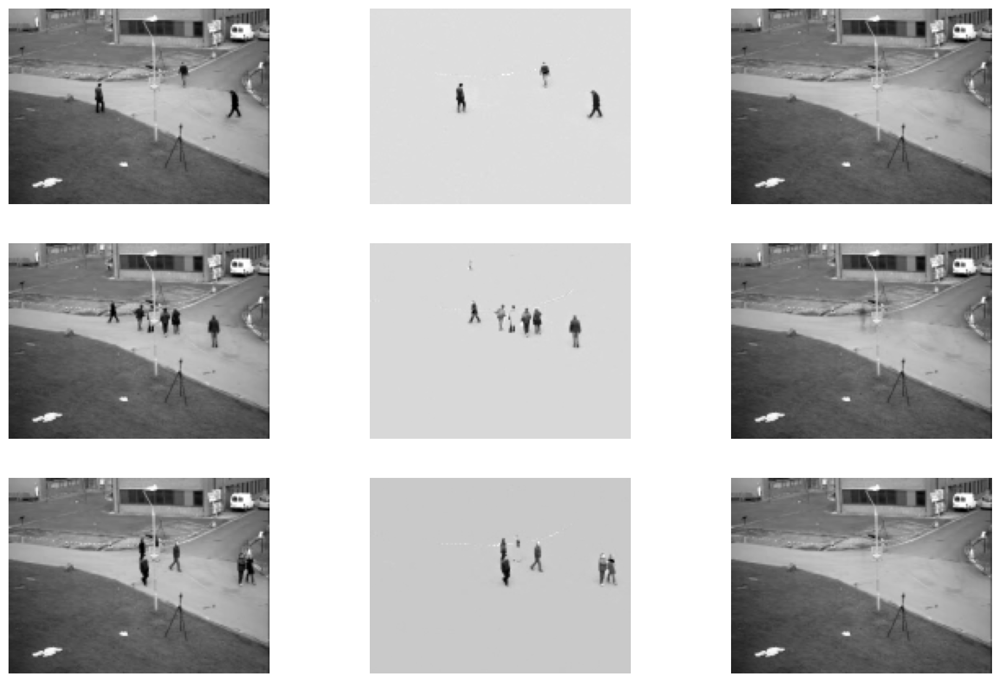

In [34]:
f = plt_images(M, S, L, [0, 100, 500], dims)

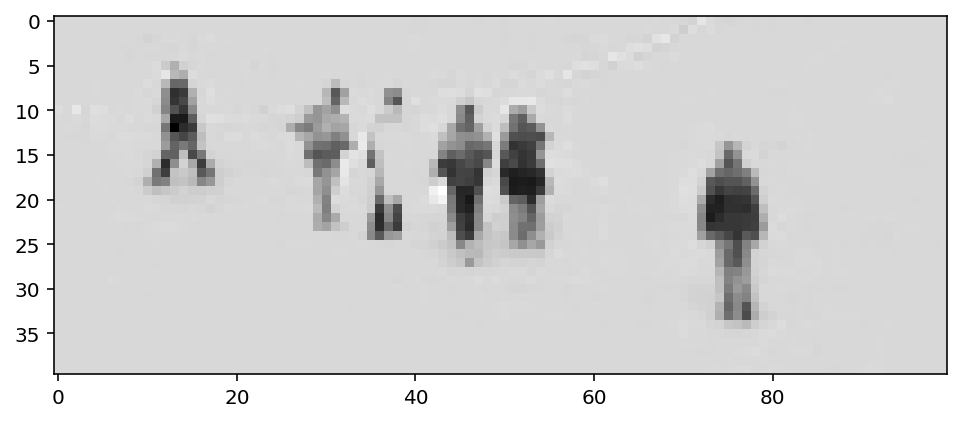

In [42]:
plt.imshow(np.reshape(S[:,100], dims)[30:70,50:150], cmap='gray')

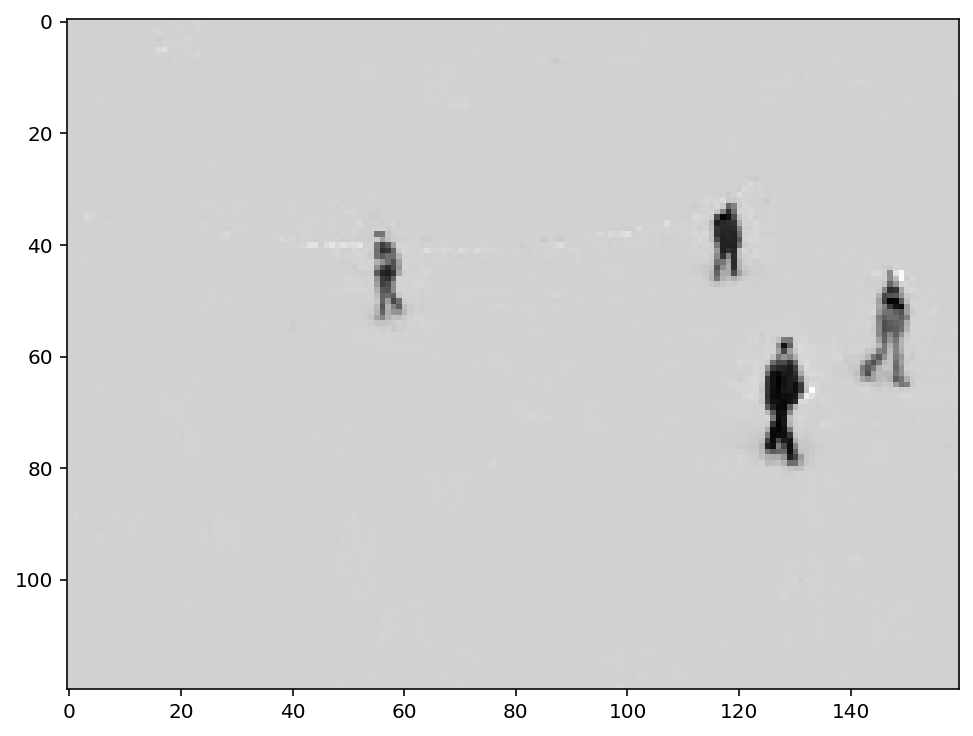

In [46]:
plt.imshow(np.reshape(M[:,550] - L[:,550], dims), cmap='gray');